In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from tifffile import imread, imwrite
from skimage.measure import regionprops
from tqdm.notebook import tqdm
from anndata import AnnData


In [2]:
# base_path = '/home/unix/jiahao/wanglab/Data/Analyzed/2024-01-08-Jiakun-MouseSpleen64Gene/'
base_path = 'Z:/Data/Analyzed/2024-01-08-Jiakun-MouseSpleen64Gene/'
image_path = os.path.join(base_path, 'images')
signal_path = os.path.join(base_path, 'signal')
output_path = os.path.join(base_path, 'output')
expr_path = os.path.join(base_path, 'expr')
if not os.path.exists(expr_path):
    os.mkdir(expr_path)

## Generate h5ad

In [3]:
sample_dict = {}
sample_dict["sample1"] = [i for i in range(1, 262 + 1)]
sample_dict["sample2"] = [i for i in range(263, 505 + 1)]
sample_dict["sample3"] = [i for i in range(506, 776 + 1)]
sample_dict["sample4"] = [i for i in range(777, 1037 + 1)]
sample_dict["sample5"] = [i for i in range(1038, 1274 + 1)]
sample_dict["sample6"] = [i for i in range(1275, 1524 + 1)]

In [ ]:
for current_sample in tqdm(np.unique(list(sample_dict.keys()))):
# for current_sample in ["sample1"]:
    print(current_sample)

    adata_list = []
    for i in tqdm(sample_dict[current_sample]):
        current_fov = f"Position{i:03}"
        adata = sc.read_h5ad(os.path.join(expr_path, current_fov, f'raw.h5ad'))
        adata_list.append(adata)

    adata = ad.concat(adata_list, index_unique="_")
    adata.write_h5ad(os.path.join(expr_path, f'{current_sample}_raw.h5ad'))
    

## QC

sample #: total_counts, n_genes 

sample 1: 1, 1

sample 2: 1, 1

sample 3: 3, 1

sample 4: 3, 1

sample 5: 2, 1

sample 6: 2, 1

all: 2, 2

In [53]:
current_sample = 'sample6'
adata = sc.read_h5ad(os.path.join(expr_path, f'{current_sample}_raw.h5ad'))
raw_obs = adata.obs.copy()
n_cells_before = adata.obs.shape[0]

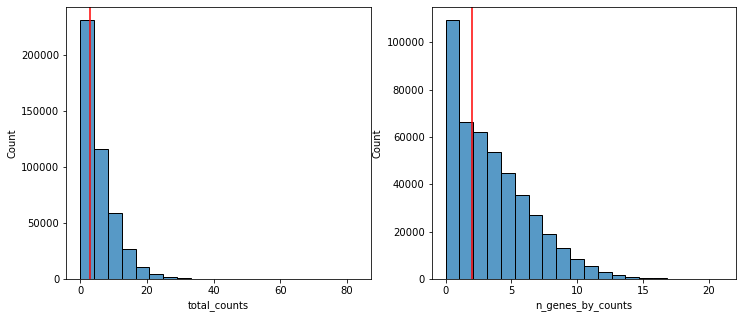

In [54]:
# calculate pp metric
sc.pp.calculate_qc_metrics(adata, inplace=True, percent_top=None)

# Calculate max count for each gene
adata.var['max_counts_sample'] = adata.X.max(axis=0)

# plot total_counts & n_genes
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12,5))
sns.histplot(adata.obs['total_counts'], bins=20, ax=axs[0])
axs[0].axvline(3, c='r')


sns.histplot(adata.obs['n_genes_by_counts'], bins=20, ax=axs[1])
axs[1].axvline(2, c='r')

# plt.savefig(os.path.join(fig_path, 'reads_filtering_threshold.pdf'))
plt.show()

In [55]:
# Filtration (cell)
min_counts = 6
min_genes = 2

sc.pp.filter_cells(adata, min_counts=min_counts)
sc.pp.filter_cells(adata, min_genes=min_genes)


adata.layers['raw'] = adata.X.copy()
n_cells_after = adata.obs.shape[0]
print(f"Number of cells before filtration: {n_cells_before}")
print(f"Number of cells after filtration: {n_cells_after}")
print(f"Percentage of cells kept: {n_cells_after/n_cells_before*100:.2f}%")

Number of cells before filtration: 450436
Number of cells after filtration: 182928
Percentage of cells kept: 40.61%


In [56]:
# save combined h5ad
# from datetime import datetime
# date = datetime.today().strftime('%Y-%m-%d')
# adata.write_h5ad(f"{expr_path}/{date}-{current_sample}-filtered.h5ad")
adata.write_h5ad(f"{expr_path}/{current_sample}-filtered.h5ad")

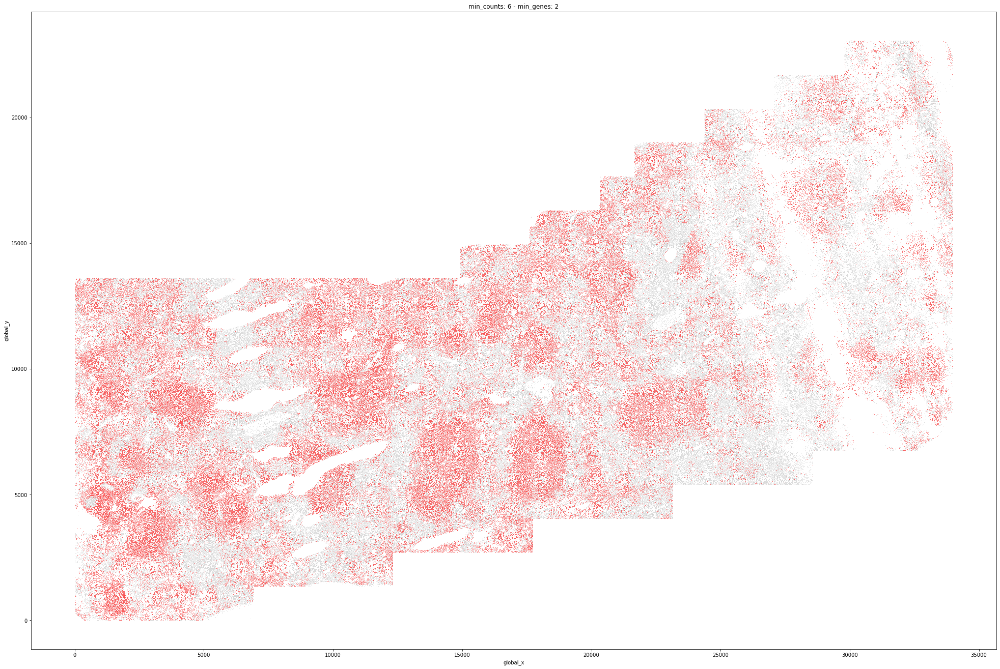

In [57]:
fig_size = np.array([raw_obs['global_x'].max(), raw_obs['global_y'].max()]) / 1000

fig, ax = plt.subplots(figsize=fig_size)
sns.scatterplot(x='global_x', y='global_y', color='#c2c2c2', data=raw_obs, s=1, ax=ax)
sns.scatterplot(x='global_x', y='global_y', color='r', data=adata.obs, s=1, ax=ax)
plt.title(f"min_counts: {min_counts} - min_genes: {min_genes}")
plt.show()

## Preprocessing

In [58]:
adata_list = []

for current_sample in tqdm(np.unique(list(sample_dict.keys()))):
    current_adata = sc.read_h5ad(os.path.join(expr_path, f'{current_sample}-filtered.h5ad'))
    adata_list.append(current_adata)

cdata = ad.concat(adata_list, index_unique="_")
cdata.write_h5ad(f"{expr_path}/combined-filtered-strict-576.h5ad")

  0%|          | 0/6 [00:00<?, ?it/s]

In [53]:
cdata = sc.read_h5ad(os.path.join(expr_path, f'combined-filtered-strict.h5ad'))
cdata

AnnData object with n_obs × n_vars = 1833564 × 64
    obs: 'sample', 'fov_id', 'volume', 'fov_x', 'fov_y', 'fov_z', 'seg_label', 'global_x', 'global_y', 'global_z', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes'
    layers: 'raw'

In [54]:
# subsample
sc.pp.subsample(cdata, fraction=0.01)
cdata.write_h5ad(f"{expr_path}/combined-filtered-strict-subsample-001.h5ad")
cdata

AnnData object with n_obs × n_vars = 18335 × 64
    obs: 'sample', 'fov_id', 'volume', 'fov_x', 'fov_y', 'fov_z', 'seg_label', 'global_x', 'global_y', 'global_z', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes'
    layers: 'raw'

In [44]:
# Normalization scaling
sc.pp.normalize_total(cdata)
sc.pp.log1p(cdata)

cdata.raw = cdata

In [45]:
# Scale data to unit variance and zero mean
sc.pp.scale(cdata)
cdata.layers['scaled'] = cdata.X.copy()

In [7]:
# Regress out unwanted variance 
sc.pp.regress_out(cdata, ['total_counts'])
cdata.layers['corrected'] = cdata.X.copy()

C:\Users\jiahao\.conda\envs\sc_38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\Users\jiahao\.conda\envs\sc_38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


In [8]:
sc.pp.combat(cdata, 'sample')
cdata.layers['combat'] = cdata.X.copy()

## Dimensionality reduction

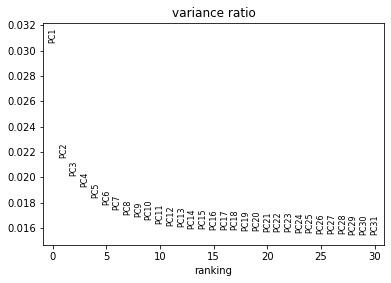

In [46]:
# Run PCA
sc.tl.pca(cdata, svd_solver='full')

# Plot explained variance 
sc.pl.pca_variance_ratio(cdata, log=False)

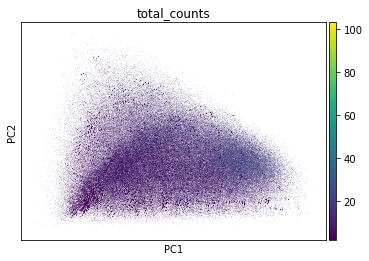

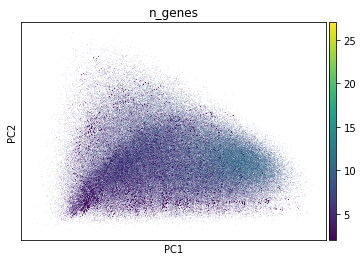

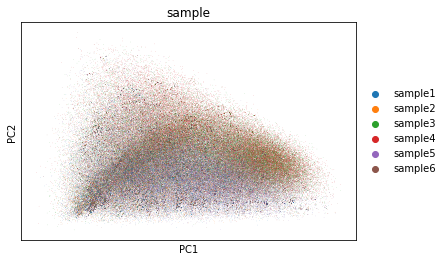

In [47]:
# Plot PCA
sc.pl.pca(cdata, color='total_counts')
sc.pl.pca(cdata, color='n_genes')
sc.pl.pca(cdata, color='sample')

In [62]:
%%time
# Computing the neighborhood graph
n_neighbors = 15
n_pcs = 30
    
sc.pp.neighbors(cdata, n_neighbors=n_neighbors, n_pcs=n_pcs)

CPU times: total: 2min 54s
Wall time: 18.1 s


In [63]:
%%time
# Run UMAP
# sc.tl.umap(cdata, min_dist=.0001, spread=5)
sc.tl.umap(cdata)

CPU times: total: 1h 33min 49s
Wall time: 9min 34s


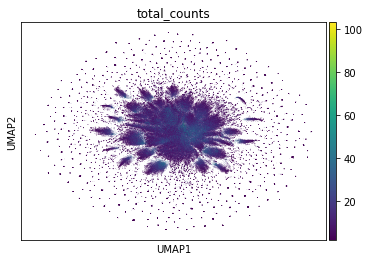

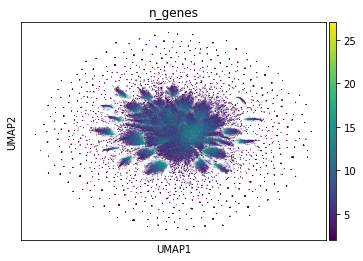

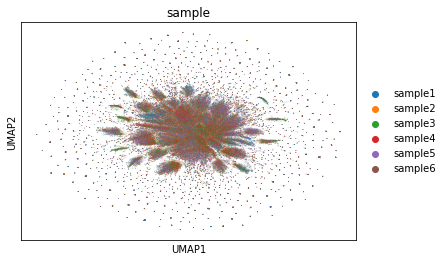

In [64]:
sc.pl.umap(cdata, color='total_counts')
sc.pl.umap(cdata, color='n_genes')
sc.pl.umap(cdata, color='sample')

In [ ]:
%%time
# Run leiden cluster
cluster_resolution = 1.5
sc.tl.leiden(cdata, resolution = cluster_resolution)
sc.pl.umap(cdata, color='leiden')

In [ ]:
# Plot UMAP with cluster labels 
min_dist = 0.0001
spread = 5
sc.tl.umap(adata, min_dist=min_dist, spread=spread)
sc.pl.umap(adata, color='leiden')

## Test

In [6]:
fig_size = np.array([adata.obs['global_x'].max(), adata.obs['global_y'].max()]) / 1000

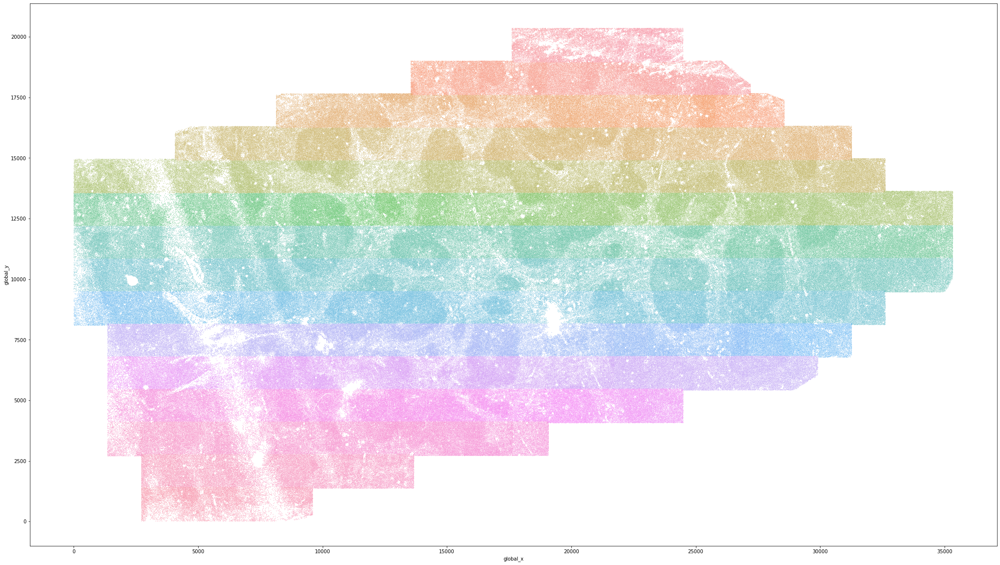

In [7]:
fig, ax = plt.subplots(figsize=fig_size)
sns.scatterplot(x='global_x', y='global_y', hue='fov_id', data=adata.obs, s=1, legend=False, ax=ax)
plt.show()

In [12]:
adata.obs['total_counts'] = adata.X.sum(axis=1)
adata.obs['total_counts_logical'] = adata.obs['total_counts'] > 2

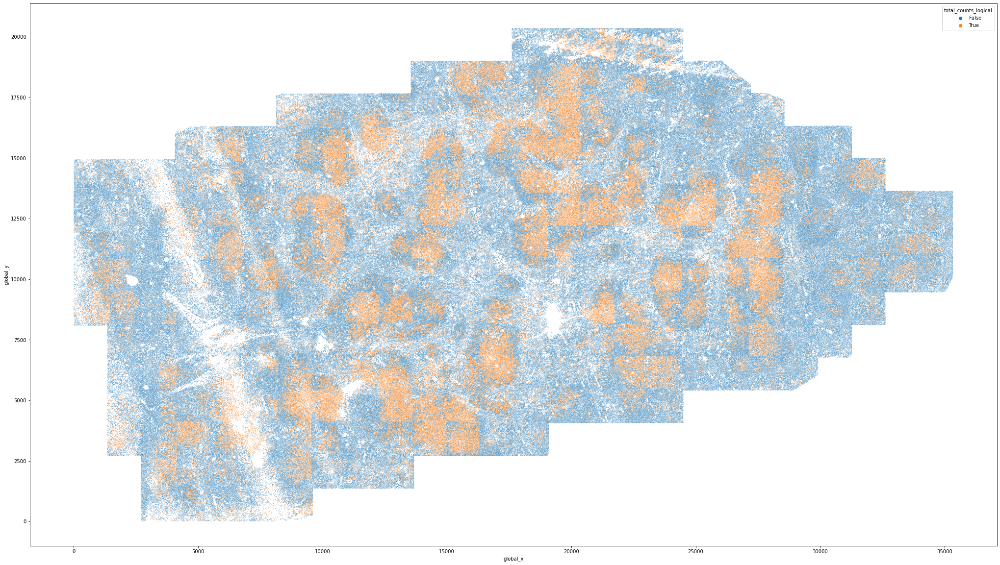

In [11]:
fig, ax = plt.subplots(figsize=fig_size)
sns.scatterplot(x='global_x', y='global_y', hue='total_counts_logical', data=adata.obs, s=1, ax=ax)
plt.show()

In [103]:
adata

AnnData object with n_obs × n_vars = 782370 × 64
    obs: 'sample', 'fov_id', 'volume', 'fov_x', 'fov_y', 'fov_z', 'seg_label', 'global_x', 'global_y', 'global_z', 'total_counts', 'total_counts_logical'

In [104]:
(adata.obs['total_counts'] > 0).sum()

573874

In [105]:
np.median(adata.obs['total_counts'])

2.0

In [106]:
adata.obs['n_genes'] = (adata.X > 0).sum(axis=1)

<AxesSubplot: xlabel='n_genes', ylabel='Count'>

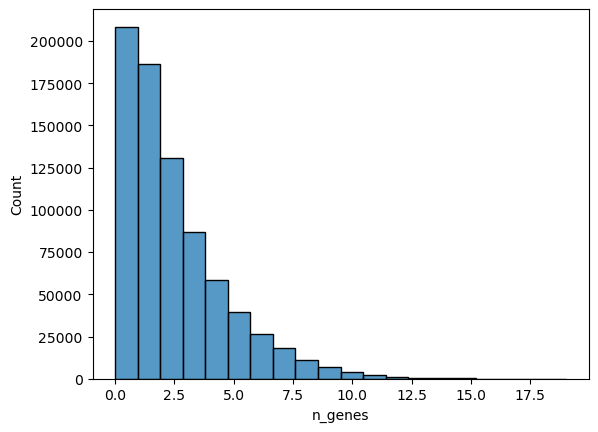

In [113]:
sns.histplot(adata.obs['n_genes'], bins=20)

## check log

In [108]:
positions = [d for d in os.listdir(expr_path) if "Position" in d]

total_assignment = []
total_coverage = []

for current_position in tqdm(positions):
    current_log = os.path.join(expr_path, current_position, 'log.txt')  
    with open(current_log, 'r') as f:
        lines = [line.rstrip() for line in f]
        current_assignment = lines[0].split('%')[0]
        current_coverage = lines[1].split(' ')[2].split('%')[0]
        total_assignment.append(float(current_assignment))
        total_coverage.append(float(current_coverage))

        if float(current_coverage) > 100:
            print(current_position, current_assignment)

  0%|          | 0/1524 [00:00<?, ?it/s]

Position021 70.34
Position1497 52.11
Position325 16.16
Position1401 51.58
Position531 71.27
Position1193 57.76
Position372 32.07
Position1008 62.44
Position1245 52.48
Position637 73.61
Position779 57.22
Position1085 48.80
Position178 60.58
Position048 68.21
Position084 72.14
Position1249 66.73
Position1320 53.22
Position1050 46.66
Position170 64.22
Position016 57.69
Position811 47.41
Position191 67.61
Position1055 48.60
Position355 43.48
Position010 78.12
Position1447 54.21
Position112 70.73
Position069 69.49
Position1095 33.59
Position059 61.72
Position417 17.08
Position047 73.24
Position621 71.39
Position812 52.14
Position886 61.52
Position008 54.33
Position558 70.63
Position005 49.79
Position513 54.28
Position1523 41.81
Position395 53.46
Position782 43.79
Position494 24.01
Position455 12.58
Position659 52.82
Position1432 57.92
Position819 67.87
Position064 80.28
Position1158 55.65
Position676 33.29
Position186 50.96
Position409 20.63
Position050 50.61
Position917 61.16
Position431 2

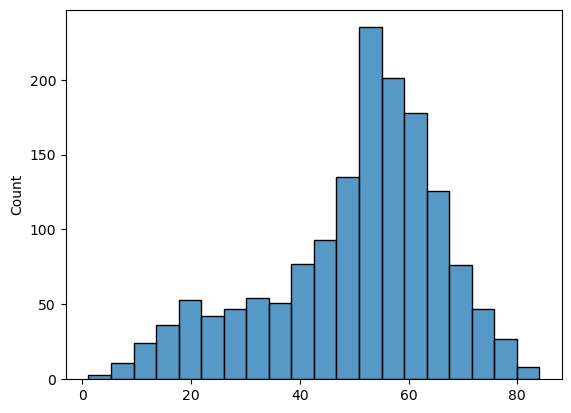

In [109]:
sns.histplot(total_assignment, bins=20)
plt.show()

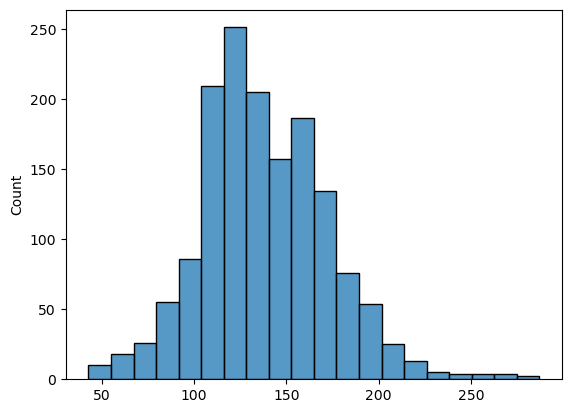

In [110]:
sns.histplot(total_coverage, bins=20)
plt.show()

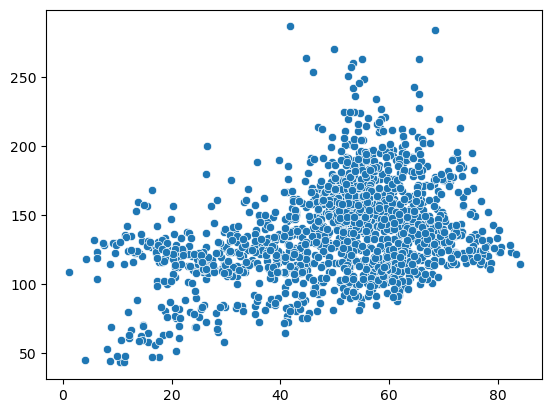

In [111]:
sns.scatterplot(x=total_assignment, y=total_coverage)
plt.show()